---
---
---

## Summary

L'objectif est de construire un modèle de classification capable de **prédire si une personne gagne plus ou moins de 50 000 dollars par an**, en utilisant ses caractéristiques socio-démographiques.

Le jeu de données est **"Adult Income"** du [UCI Machine Learning Repository](https://archive.ics.uci.edu/).

- **[UCIMLREPO](https://github.com/uci-ml-repo/ucimlrepo) package**

Le package UCIMLRepo (pour **UCI Machine Learning Repository**) est une **bibliothèque Python** qui facilite l’accès aux jeux de données disponibles sur le célèbre dépôt [UCI Machine Learning Repository](https://archive.ics.uci.edu/). Il permet de **chercher, télécharger et utiliser facilement ces datasets directement dans un notebook Python**, sans avoir à passer par un téléchargement manuel.

---

## Packages

---

In [1]:
%pip install dill imblearn pendulum ucimlrepo yellowbrick loguru

In [2]:
from pathlib import Path

import dill
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import pendulum
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
from imblearn.pipeline import Pipeline as imb_Pipeline
from loguru import logger
from sklearn import set_config
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (confusion_matrix,
                             classification_report,
                             ConfusionMatrixDisplay,
                             roc_auc_score,
                             accuracy_score,
                             precision_score,
                             recall_score,
                             f1_score,
                             RocCurveDisplay,
                             PrecisionRecallDisplay,
                            )
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OrdinalEncoder, OneHotEncoder
from ucimlrepo import fetch_ucirepo, list_available_datasets
from yellowbrick.classifier import DiscriminationThreshold

set_config(display='diagram')
pd.set_option("display.max_columns", None)

---

## Settings

---

In [3]:
EXECUTION_DATE = pendulum.now(tz="UTC")


ROOT_DIR = Path().cwd()
MODEL_DIR = Path(ROOT_DIR, "models")

MODEL_DIR.mkdir(parents=True, exist_ok=True)
logger.info(f"Model directory: {MODEL_DIR}")

2025-05-03 23:51:55.340 | INFO     | __main__:<module>:8 - Model directory: d:\Users\hp\Documents\bibliothèque de travail\ELEVE INGENIEUR\ISE\Cours\ISE2\Semestre 2\MACHINE LEARNING II\Cours\tp-supervised-learning-master\models


---

## Data collection

---

In [4]:
# check which datasets can be imported
list_available_datasets()

-------------------------------------
The following datasets are available:
-------------------------------------
Dataset Name                                                                            ID    
------------                                                                            --    
Abalone                                                                                 1     
Adult                                                                                   2     
Annealing                                                                               3     
Audiology (Standardized)                                                                8     
Auto MPG                                                                                9     
Automobile                                                                              10    
Balance Scale                                                                           12    
Balloons                       

In [5]:
# fetch dataset
adult = fetch_ucirepo(name="Adult", id=None)
# je peux mettre name=None et id=2;

# fetch data
data = adult.data.original

logger.info(f"{data.shape}")

2025-05-03 23:52:07.120 | INFO     | __main__:<module>:8 - (48842, 15)


In [6]:
data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [7]:
# metadata
logger.info(f"Metadata \n {adult.metadata}")

# variable information
logger.info(f"Features: \n{adult.variables}")

2025-05-03 23:52:07.361 | INFO     | __main__:<module>:2 - Metadata 
 {'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Tue Sep 24 2024', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'intro_paper': None, 'additional_info': {'summary': "Extraction was done by Barry Becker from the 1994 Census da

In [8]:
data.describe(include="all")

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
count,48842.000000,47879,4.884200e+04,48842,48842.000000,48842,47876,48842,48842,48842,48842.000000,48842.000000,48842.000000,48568,48842
unique,NaN,9,NaN,16,NaN,7,15,6,5,2,NaN,NaN,NaN,42,4
top,NaN,Private,NaN,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,<=50K
freq,NaN,33906,NaN,15784,NaN,22379,6172,19716,41762,32650,NaN,NaN,NaN,43832,24720
mean,38.643585,NaN,1.896641e+05,NaN,10.078089,NaN,NaN,NaN,NaN,NaN,1079.067626,87.502314,40.422382,NaN,NaN
std,13.710510,NaN,1.056040e+05,NaN,2.570973,NaN,NaN,NaN,NaN,NaN,7452.019058,403.004552,12.391444,NaN,NaN
min,17.000000,NaN,1.228500e+04,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN
25%,28.000000,NaN,1.175505e+05,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
50%,37.000000,NaN,1.781445e+05,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
75%,48.000000,NaN,2.376420e+05,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN,NaN


In [9]:
#data.hours-per-week

In [10]:
# remplacer les tirets de 6 (-) par underscore (_) car avec -,
# on ne peut pas utiliser l'option . pour acceder aux variables comme data.hours-per-week
data.columns = data.columns.str.replace("-", "_")
data.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital_status', 'occupation', 'relationship', 'race', 'sex',
       'capital_gain', 'capital_loss', 'hours_per_week', 'native_country',
       'income'],
      dtype='object')

In [11]:
data.hours_per_week

0        40
1        13
2        40
3        40
4        40
         ..
48837    36
48838    40
48839    50
48840    40
48841    60
Name: hours_per_week, Length: 48842, dtype: int64

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48842 non-null  int64 
 1   workclass       47879 non-null  object
 2   fnlwgt          48842 non-null  int64 
 3   education       48842 non-null  object
 4   education_num   48842 non-null  int64 
 5   marital_status  48842 non-null  object
 6   occupation      47876 non-null  object
 7   relationship    48842 non-null  object
 8   race            48842 non-null  object
 9   sex             48842 non-null  object
 10  capital_gain    48842 non-null  int64 
 11  capital_loss    48842 non-null  int64 
 12  hours_per_week  48842 non-null  int64 
 13  native_country  48568 non-null  object
 14  income          48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


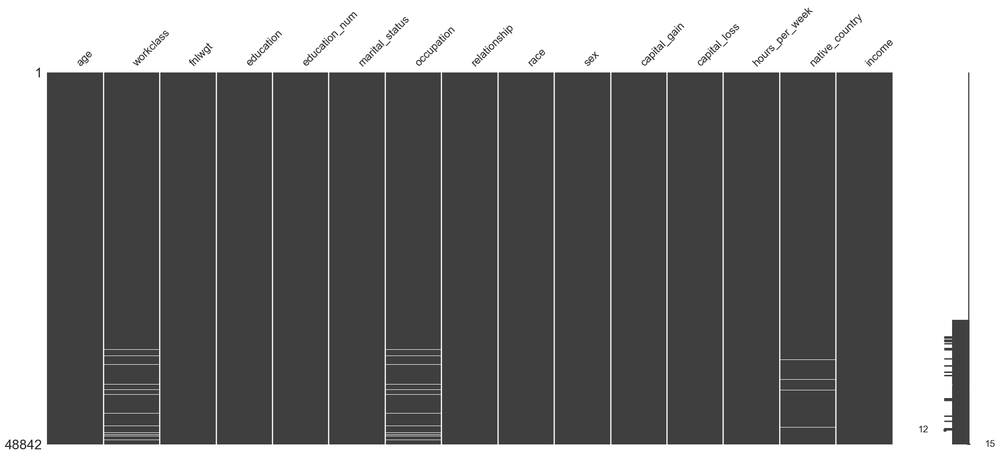

In [13]:
msno.matrix(data);

---

## EDA: Exploratory Data Analysis

---

In [14]:
data["income"].value_counts(normalize=False)

income
<=50K     24720
<=50K.    12435
>50K       7841
>50K.      3846
Name: count, dtype: int64

### Target

In [15]:
data = data.assign(income= lambda dfr: dfr.income.str.replace(".", ""))

In [16]:
label_distribution = data.groupby(['income']).size().reset_index(name='count')
label_distribution

,income,count
0,<=50K,37155
1,>50K,11687


In [17]:
# Plot a pie chart with custom colors for income
fig = px.pie(
    label_distribution,
    names='income',  # Use 'income' for pie segments
    values='count',  # Use 'count' for the size of each pie slice
    # color='income',  # Color the segments based on income
    title='Income distribution',
    labels={'income': 'Income', 'count': 'Count'},
)

fig.update_traces(textinfo='percent+label')  # Display percentage and labels on the pie chart

fig.show()

### Categorical features

In [18]:
categorical_columns = data.select_dtypes(include="object").columns

categorical_columns

Index(['workclass', 'education', 'marital_status', 'occupation',
       'relationship', 'race', 'sex', 'native_country', 'income'],
      dtype='object')

In [19]:
for col_name in categorical_columns:
    logger.info(f"{col_name} ==============\n {data[col_name].value_counts(dropna=False)}\n")

2025-05-03 23:52:15.278 | INFO     | __main__:<module>:2 - workclass ==============
 workclass
Private             33906
Self-emp-not-inc     3862
Local-gov            3136
State-gov            1981
?                    1836
Self-emp-inc         1695
Federal-gov          1432
NaN                   963
Without-pay            21
Never-worked           10
Name: count, dtype: int64

2025-05-03 23:52:15.287 | INFO     | __main__:<module>:2 - education ==============
 education
HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th               756
12th              657
Doctorate         594
5th-6th           509
1st-4th           247
Preschool          83
Name: count, dtype: int64

2025-05-03 23:52:15.293 | INFO     | __main__:<module>:2 - marital_status ==============
 marital_status
Married-civ-spouse       22379
Never-ma

#### Preprocessing

In [20]:
# Replace “?” with None for all columns containing it
data.replace("?", None, inplace=True)

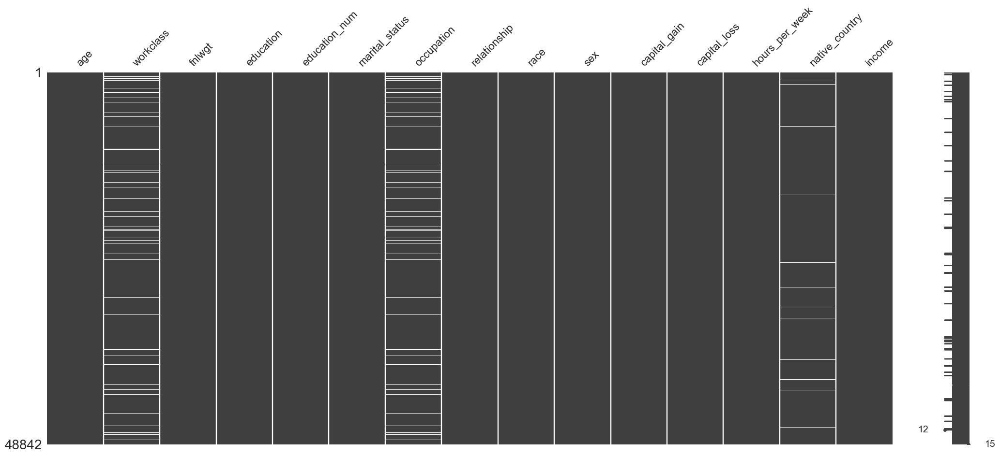

In [21]:
msno.matrix(data);

### Remove Duplicated

In [22]:
# Shape after deduplication
data.shape

(48842, 15)

In [23]:
# Check for the duplicates: if True then there are duplicated
data.duplicated().any()

True

In [24]:
data[data.duplicated(keep=False)].sort_values(["workclass", "education", "relationship"])

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
24667,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
36713,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
5842,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
22300,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38993,22,NaN,334593,Some-college,10,Never-married,NaN,Not-in-family,White,Male,0,0,40,United-States,<=50K
10094,19,None,167428,Some-college,10,Never-married,None,Own-child,White,Male,0,0,40,United-States,<=50K
30384,20,None,203353,Some-college,10,Never-married,None,Own-child,White,Female,0,0,40,United-States,<=50K
34424,20,NaN,203353,Some-college,10,Never-married,NaN,Own-child,White,Female,0,0,40,United-States,<=50K


In [25]:
# Drop duplicates
data = data.drop_duplicates(keep='first', inplace=False)
data.shape

(48790, 15)

In [26]:
# Shape after deduplication
data.shape

(48790, 15)

### Numerical features

In [27]:
data["capital_diff"] = data['capital_gain'] - data['capital_loss']

In [28]:
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

In [29]:
# Initialize a figure
fig = go.Figure()

# Iterate over numeric columns in the DataFrame
for column in numeric_columns:
    fig.add_trace(go.Box(
        y=data[column],
        name=column,
        marker=dict(color='skyblue')
    ))

# Update layout with a title and axis labels
fig.update_layout(
    title='Distribution of Numeric Columns without Outliers',
    yaxis_title='Values',
    xaxis_title='Numeric Columns'
)

# Show the figure
fig.show()


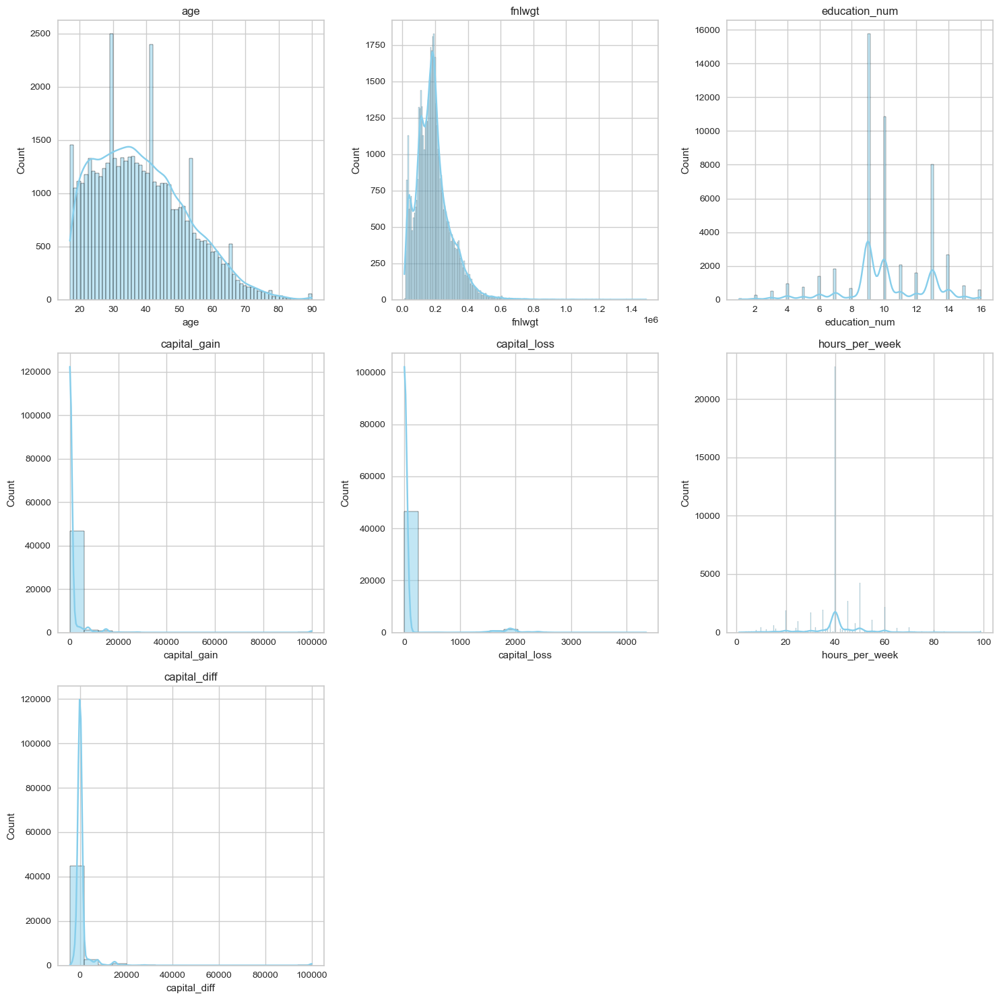

In [30]:
n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col_name in enumerate(numeric_columns):
    sns.histplot(data[col_name], kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(col_name)

for i in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

### Bivariate analysis

In [31]:
px.box(
    data,
    x='income',  # Income category on the x-axis
    y='age',  # Age distribution on the y-axis
    title='Age Distribution by Income',
    labels={'income': 'Income Category', 'age': 'Age'}
)

In [32]:
data

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,capital_diff
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K,0
48838,64,NaN,321403,HS-grad,9,Widowed,NaN,Other-relative,Black,Male,0,0,40,United-States,<=50K,0
48839,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K,0
48840,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K,5455


In [33]:
for col_name in ["workclass",
                 "education",
                 "marital_status",
                 "sex"
                ]:

    feature_income_counts = data.groupby([col_name, 'income']).size().unstack()

    fig = px.bar(feature_income_counts,
                 barmode='stack',  # Stack bars for income categories
                 title=f'Relationship between Income and {col_name}',
                 labels={'value': 'Count'}
                )
    fig.show()

In [34]:
for col_name in numeric_columns:

    #counts
    num_feat_income_counts = data.groupby([col_name, "income"]).size().unstack()

    # Plot using iplot
    fig = px.area(num_feat_income_counts,
                  title=f"Relationship between {col_name} and income",
                  labels={"value": "Count"}
                 )
    fig.show()

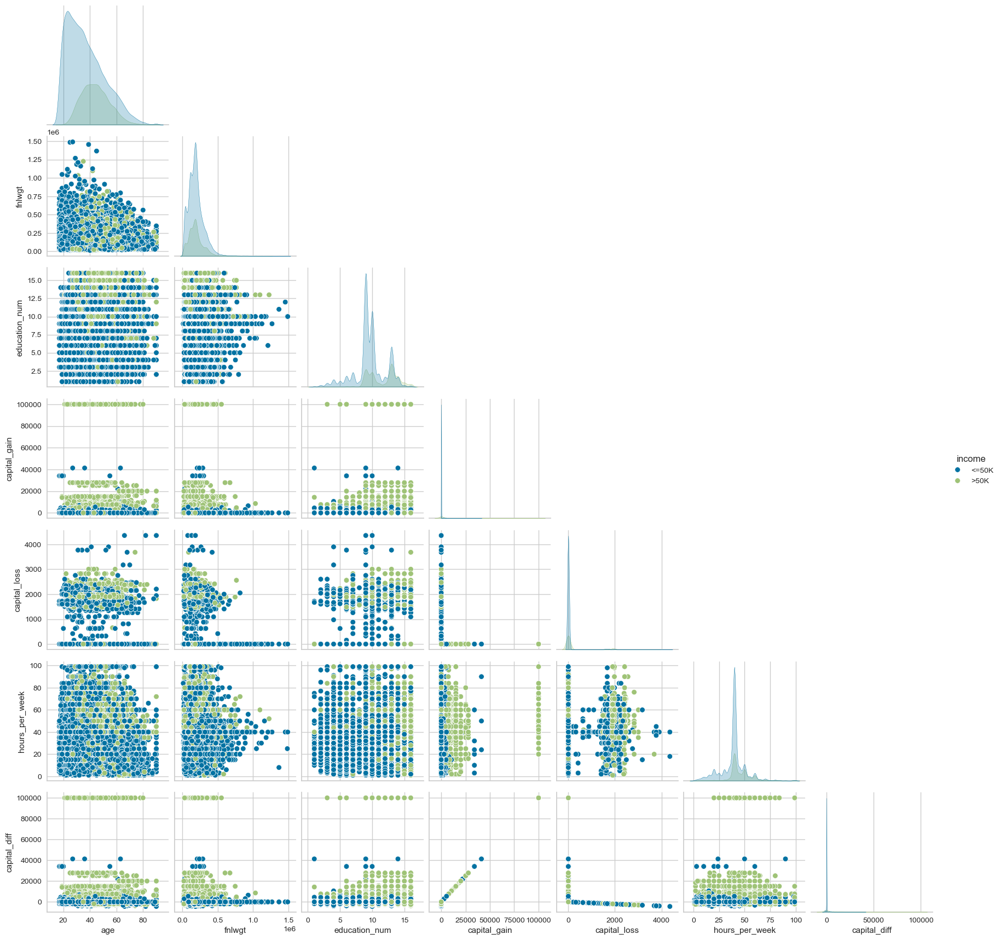

In [35]:
sns.pairplot(data, hue="income", corner=True);

### Correlation

In [36]:
corr_matrix = data.loc[:, numeric_columns].corr()


In [37]:
data.loc[:, numeric_columns].corr()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,capital_diff
age,1.000000,-0.076451,0.030635,0.077185,0.056838,0.071223,0.073878
fnlwgt,-0.076451,1.000000,-0.038727,-0.003715,-0.004378,-0.013521,-0.003467
education_num,0.030635,-0.038727,1.000000,0.125219,0.080986,0.143915,0.120459
capital_gain,0.077185,-0.003715,0.125219,1.000000,-0.031475,0.082152,0.998547
capital_loss,0.056838,-0.004378,0.080986,-0.031475,1.000000,0.054431,-0.085285
hours_per_week,0.071223,-0.013521,0.143915,0.082152,0.054431,1.000000,0.078959
capital_diff,0.073878,-0.003467,0.120459,0.998547,-0.085285,0.078959,1.000000


<Axes: >

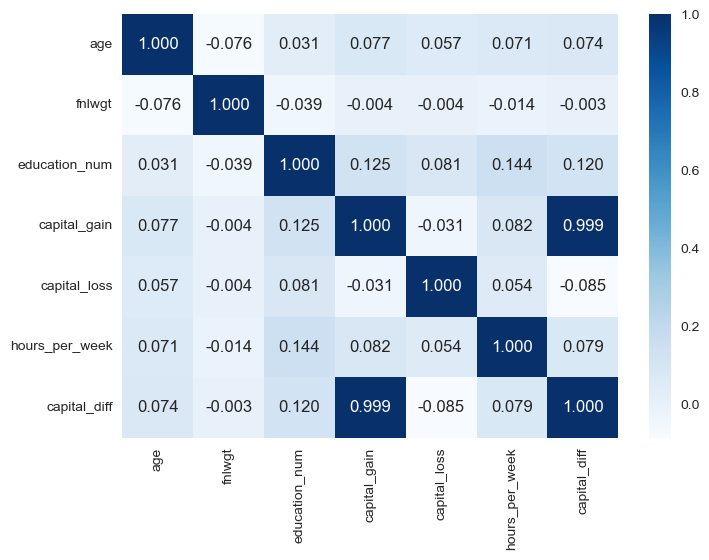

In [38]:
sns.heatmap(corr_matrix, annot=True, fmt=".3f", cmap="Blues")

---
---
---

## Data preparation

---

In [39]:
data.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,capital_diff
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0


In [40]:
# Removing rows where 'Workclass' is 'Without-pay' and 'Never-worked'
data = data[~data["workclass"].str.lower().isin(["without-pay", "never-worked"])
            # & data["hours_per_week"].between(20, 60)
           ]
data.shape

(48759, 16)

In [41]:
data["hours_per_week"].value_counts(sort=False).sort_index()

hours_per_week
1      27
2      53
3      59
4      83
5      95
     ... 
95      2
96      9
97      2
98     14
99    137
Name: count, Length: 96, dtype: int64

In [42]:
#Feature mapping
workclass_mapping = {
    'Private': 'Private',
    'Self-emp-not-inc': 'Self-Employed',
    'Local-gov': 'Government',
    'State-gov': 'Government',
    'Self-emp-inc': 'Self-Employed',
    'Federal-gov': 'Government',
    'Without-pay': 'Other',
    'Never-worked': 'Other'
}

marital_status_mapping = {
    "Married-civ-spouse": "Married",
    "Married-spouse-absent": "Married",
    "Married-AF-spouse": "Married",
    "Separated": "Married",
    "Never-married": "Single",
    "Divorced": "Single",
    "Widowed": "Single"
}

relationship_mapping = {
    'Husband': 'spouse',
    'Not-in-family': 'Others:',
    'Own-child': 'Immediate Family',
    'Unmarried': 'Others:',
    'Wife': 'spouse',
    'Other-relative': 'Immediate Family',
}

# occupation
# occupation_mapping = to be defined if necessary

In [43]:
data = data.assign(income=lambda dfr: dfr['income'].map({"<=50K": 0, ">50K": 1}),
                   # capital_diff_bin = lambda dfr: pd.cut(dfr['capital_diff'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
                   native_country=lambda dfr: dfr["native_country"].fillna("United-States").map(lambda val: val if val == "United-States" else "Others"),
                   education=lambda dfr: dfr.education.replace(["11th", "9th", "7th-8th", "5th-6th", "10th", "1st-4th", "12th"], "School"),
                   race=lambda dfr: dfr.race.map(lambda val: 'White' if val == 'White' else 'Others'),
                   # workclass=lambda dfr: dfr.workclass.map(workclass_mapping),
                   # marital_status=lambda dfr: dfr.marital_status.map(marital_status_mapping),
                   # relationship=lambda dfr: dfr.relationship.map(relationship_mapping),
                  )

## Train / test split

In [44]:
data.drop(['capital_gain',
           'capital_loss',
           "fnlwgt",  # fnlwgt (Final Weight): Represents the weight assigned to each individual.
           "education_num",
       ], axis=1, inplace=True)


In [45]:
x_values = data.drop(columns=['income'])
y_target = data.income

In [46]:
x_train, x_test, y_train, y_test = train_test_split(x_values, y_target, test_size=0.2, random_state=42, stratify=y_target)

In [47]:
x_train.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,hours_per_week,native_country,capital_diff
44101,35,Local-gov,Bachelors,Married-civ-spouse,Protective-serv,Husband,White,Male,48,United-States,0
36845,61,Private,HS-grad,Divorced,Machine-op-inspct,Not-in-family,White,Female,40,United-States,0
44706,41,Private,Some-college,Divorced,Sales,Unmarried,White,Male,46,United-States,0
35127,49,Self-emp-not-inc,School,Married-civ-spouse,Farming-fishing,Husband,White,Male,50,United-States,0
41678,37,Self-emp-not-inc,Assoc-voc,Married-civ-spouse,Farming-fishing,Husband,White,Male,60,United-States,0


In [48]:
y_train.value_counts(normalize=True).mul(100).round(2)

income
0    76.05
1    23.95
Name: proportion, dtype: float64

In [49]:
y_train.value_counts(normalize=True).mul(100).round(2)

income
0    76.05
1    23.95
Name: proportion, dtype: float64

### Feature engineering

In [50]:
x_values.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,hours_per_week,native_country,capital_diff
0,39,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,40,United-States,2174
1,50,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,13,United-States,0
2,38,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,40,United-States,0
3,53,Private,School,Married-civ-spouse,Handlers-cleaners,Husband,Others,Male,40,United-States,0
4,28,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Others,Female,40,Others,0


In [51]:
# numerical
numeric_features = x_values.select_dtypes(include="number").columns

# categorical
onehot_features = ['workclass', 'occupation', 'relationship', 'race', 'sex', 'marital_status']

country_feature = ["native_country"]
ordinal_features = ['education',
                   # 'capital_diff_bin',
                  ]

cat_for_edu = ['Preschool', 'School', 'HS-grad','Some-college', 'Assoc-voc', 'Assoc-acdm','Bachelors', 'Masters', 'Prof-school', 'Doctorate']
cat_for_capdiff = ['Low', 'High']

In [52]:
x_train.loc[:, numeric_features]

,age,hours_per_week,capital_diff
44101,35,48,0
36845,61,40,0
44706,41,46,0
35127,49,50,0
41678,37,60,0
...,...,...,...
2324,63,50,0
30520,21,40,0
42196,60,25,0
41858,34,40,0


In [53]:
x_train.loc[:, numeric_features]

,age,hours_per_week,capital_diff
44101,35,48,0
36845,61,40,0
44706,41,46,0
35127,49,50,0
41678,37,60,0
...,...,...,...
2324,63,50,0
30520,21,40,0
42196,60,25,0
41858,34,40,0


In [54]:
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])


# Education : ordinal + imputation 'undefined' gérée via catégorie manquante
ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='undefined')),
    ('ordinal', OrdinalEncoder(categories=[cat_for_edu + ['undefined']], handle_unknown='use_encoded_value', unknown_value=-1))
])

# OneHot : autres variables catégorielles avec imputation "undefined"
onehot_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='undefined')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Native country : imputation avec "United-States"
country_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='United-States')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Pipeline
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_features),
    ('ord', ordinal_transformer, ordinal_features),
    ('cat', onehot_transformer, onehot_features),
    ('country', country_transformer, country_feature)
])



preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                ('ord',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(fill_value='undefined',
                                                                strategy='constant')),
                                                 ('ordinal',
                                                  OrdinalEncoder(categories=[['Preschool',
                                                                              'School',
                                                                              'HS-...
                                                  SimpleImputer(fill_value='undefined',
                                                                strategy='constant')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['workclass', 'occupation', 'relationship',
                                  'race', 'sex', 'marital_status']),
                                ('country',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(fill_value='United-States',
                                                                strategy='constant')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['native_country'])])

---
---
---

## Modeling

---

### Dummy regressor

---

In [55]:
# Pipeline
dm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', DummyClassifier())
])

dm_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', DummyClassifier())])

In [56]:
# Training
dm_pipeline.fit(x_train, y_train)

# Predictions & evaluation
dm_y_pred_test = dm_pipeline.predict(x_test)
dm_y_proba_test = dm_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, dm_y_proba_test):.2f}")

logger.info(f"Classification report: \n{classification_report(y_test, dm_y_pred_test)}")

2025-05-03 23:56:56.751 | INFO     | __main__:<module>:9 - AUC: 0.50
c:\Users\pc\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\pc\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\pc\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

2025-05-03 23:56:56.794 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.76      1.00      0.86      7416


In [57]:
y_test.value_counts()

income
0    7416
1    2336
Name: count, dtype: int64

In [58]:
x_test.shape

(9752, 11)

---
---
---

### Logistic regression

---

In [59]:
# Pipeline
rl_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
('clf', LogisticRegression(max_iter=1000))
])

rl_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', LogisticRegression(max_iter=1000))])

---

##### Baseline

In [60]:
# 8. Entraînement
rl_pipeline.fit(x_train, y_train)

# 9. Prédictions & évaluation
rl_y_pred_test = rl_pipeline.predict(x_test)
rl_y_proba_test = rl_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, rl_y_proba_test):.2f} ")

logger.info(f"Classification report: \n{classification_report(y_test, rl_y_pred_test)}")

2025-05-03 23:56:58.428 | INFO     | __main__:<module>:9 - AUC: 0.90 
2025-05-03 23:56:58.489 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      7416
           1       0.72      0.59      0.65      2336

    accuracy                           0.85      9752
   macro avg       0.80      0.76      0.78      9752
weighted avg       0.84      0.85      0.84      9752



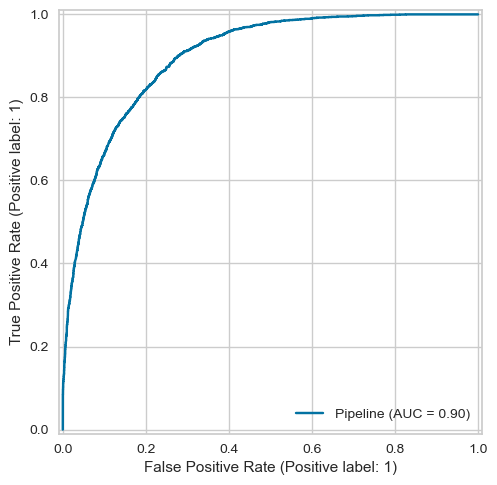

In [61]:
RocCurveDisplay.from_estimator(rl_pipeline, x_test, y_test);

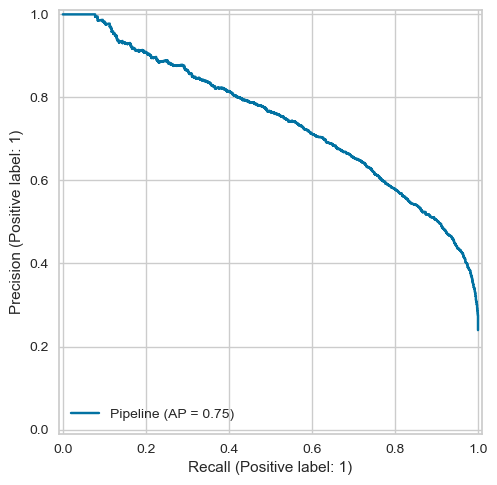

In [62]:
PrecisionRecallDisplay.from_estimator(rl_pipeline, x_test, y_test);


---

##### Tuning hyperparameters

In [63]:
rl_param_grid = {
    "clf__penalty": ["l2"],  # 'l1' si solver = 'liblinear' ou 'saga'
    "clf__C": [0.01, 0.1, 1, 2, 3, 5, 10],
    "clf__solver": ['liblinear', 'lbfgs', "sag", "saga"],  # lbfgs ne supporte que l2
    "clf__class_weight": ['balanced', None],
}

In [64]:
# Cross-validation
cv = StratifiedKFold(n_splits=5)

rl_grid_search= GridSearchCV(rl_pipeline, rl_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)

In [65]:
# Training
rl_grid_search.fit(x_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                                        ('ord',
                                                                         Pipeline(steps=[('imputer',
                                                                                          Simpl...
                                                                                          SimpleImputer(fill_value='United-States',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['native_country'])])),
                                       ('clf',
                                        LogisticRegression(max_iter=1000))]),
             n_jobs=-1,
             param_grid={'clf__C': [0.01, 0.1, 1, 2, 3, 5, 10],
                         'clf__class_weight': ['balanced', None],
                         'clf__penalty': ['l2'],
                         'clf__solver': ['liblinear', 'lbfgs', 'sag', 'saga']},
             scoring='roc_auc')

In [66]:
# Best params
logger.info(f"Best params : {rl_grid_search.best_params_}")

# Evaluation
rl_y_pred_test_opt = rl_grid_search.predict(x_test)
rl_y_proba_test_opt  = rl_grid_search.predict_proba(x_test)[:, 1]

logger.info(f"AUC : {roc_auc_score(y_test, rl_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, rl_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, rl_y_pred_test_opt):.2f}")


2025-05-04 00:06:15.355 | INFO     | __main__:<module>:2 - Best params : {'clf__C': 10, 'clf__class_weight': 'balanced', 'clf__penalty': 'l2', 'clf__solver': 'lbfgs'}
2025-05-04 00:06:15.487 | INFO     | __main__:<module>:8 - AUC : 0.90
2025-05-04 00:06:15.499 | INFO     | __main__:<module>:9 - F1-score : 0.66
2025-05-04 00:06:15.505 | INFO     | __main__:<module>:10 - Accuracy : 0.79


In [67]:
data_lift = pd.DataFrame({"y_true": y_test, "y_pred": rl_y_pred_test_opt, "proba": rl_y_proba_test_opt})
data_lift = data_lift.sort_values("proba", ascending=False).reset_index(drop=True)
data_lift.head()
# Decile
data_lift["decile"] = pd.qcut(data_lift.index, 10, labels=False)
data_lift.head()# features importances
# Global positive rate
global_positive_rate =  data_lift["y_true"].sum() / len(data_lift)
global_positive_rate
lift_aggregate_table = data_lift.groupby("decile")["y_true"].agg(["sum","count"])

In [68]:
lift_aggregate_table["cum_positives"] = lift_aggregate_table["sum"].cumsum()

lift_aggregate_table["positive_rate_cum"] = lift_aggregate_table["cum_positives"] / lift_aggregate_table["count"].cumsum()
lift_aggregate_table["lift_score"] = lift_aggregate_table["positive_rate_cum"] / global_positive_rate

lift_aggregate_table["percent_sample"] = 10 * (lift_aggregate_table.index + 1)

lift_aggregate_table

,sum,count,cum_positives,positive_rate_cum,lift_score,percent_sample
decile,,,,,,
0,818,976,818,0.838115,3.498842,10
1,570,975,1388,0.711430,2.969977,20
2,393,975,1781,0.608681,2.541034,30
3,260,975,2041,0.523199,2.184177,40
4,164,975,2205,0.452215,1.887842,50
5,78,975,2283,0.390190,1.628908,60
6,33,975,2316,0.339291,1.416424,70
7,15,975,2331,0.298808,1.247420,80
8,5,975,2336,0.266180,1.111212,90


In [69]:
px.line(
    lift_aggregate_table,
    x="percent_sample",
    y="lift_score",
    labels={
        "percent_sample": "Cumulative % of Sample",
        "lift_score": "Lift Score"
    },
    title="Lift Curve"
)

---

##### Discrimination threshold

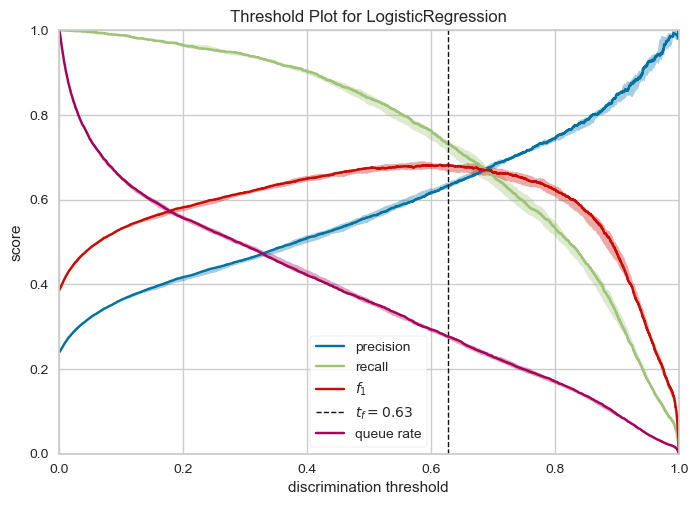

In [70]:
viz = DiscriminationThreshold(rl_grid_search.best_estimator_, random_state=42, fbeta=1.0, cv=cv, argmax="fscore")

# Fit et plot
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
viz.show();

In [ ]:
best_threshold_rl=0.63
logger.info(f"Best threshold:{best_threshold_rl}")

2025-05-04 00:10:16.535 | INFO     | __main__:<module>:2 - Best threshold:0.62


In [72]:
print(classification_report(y_test,rl_y_pred_test_opt))

              precision    recall  f1-score   support

           0       0.94      0.78      0.85      7416
           1       0.55      0.84      0.66      2336

    accuracy                           0.79      9752
   macro avg       0.74      0.81      0.76      9752
weighted avg       0.85      0.79      0.81      9752



In [73]:
# Evaluation avec seuil
rl_y_proba_test_opt = rl_grid_search.predict_proba(x_test)[:, 1]
rl_y_pred_test_opt = (rl_y_proba_test_opt >= best_threshold_rl).astype(int)

logger.info(f"AUC : {roc_auc_score(y_test, rl_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, rl_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, rl_y_pred_test_opt):.2f}")

2025-05-04 00:10:17.035 | INFO     | __main__:<module>:5 - AUC : 0.90
2025-05-04 00:10:17.052 | INFO     | __main__:<module>:6 - F1-score : 0.68
2025-05-04 00:10:17.057 | INFO     | __main__:<module>:7 - Accuracy : 0.83


---

##### Model analysis

In [74]:
# features importances

##### Save model

In [75]:
# Save model

model_path_name = Path(MODEL_DIR, "best_logistic_model.dill")

logger.info(f"Model path name: {model_path_name}")
with open(model_path_name, "wb") as fp:
    dill.dump(rl_grid_search.best_estimator_, fp)

2025-05-04 00:10:17.136 | INFO     | __main__:<module>:5 - Model path name: d:\Users\hp\Documents\bibliothèque de travail\ELEVE INGENIEUR\ISE\Cours\ISE2\Semestre 2\MACHINE LEARNING II\Cours\tp-supervised-learning-master\models\best_logistic_model.dill


---
---
---

### KNN

---

#### Baseline

In [76]:
# Pipeline
knn_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', KNeighborsClassifier(n_neighbors=10))
])

knn_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', KNeighborsClassifier(n_neighbors=10))])

In [77]:
# 8. Entraînement
knn_pipeline.fit(x_train, y_train)

# 9. Prédictions & évaluation
knn_y_pred_test = knn_pipeline.predict(x_test)
knn_y_proba_test = knn_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, knn_y_proba_test):.2f}")

logger.info(f"Classification report: \n{classification_report(y_test, knn_y_pred_test)}")

2025-05-04 00:11:37.532 | INFO     | __main__:<module>:9 - AUC: 0.88
2025-05-04 00:11:37.695 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      7416
           1       0.72      0.56      0.63      2336

    accuracy                           0.84      9752
   macro avg       0.80      0.75      0.77      9752
weighted avg       0.84      0.84      0.84      9752



In [78]:
#class_names = np.unique(y_test)
class_names=knn_pipeline.classes_
class_names

array([0, 1], dtype=int64)

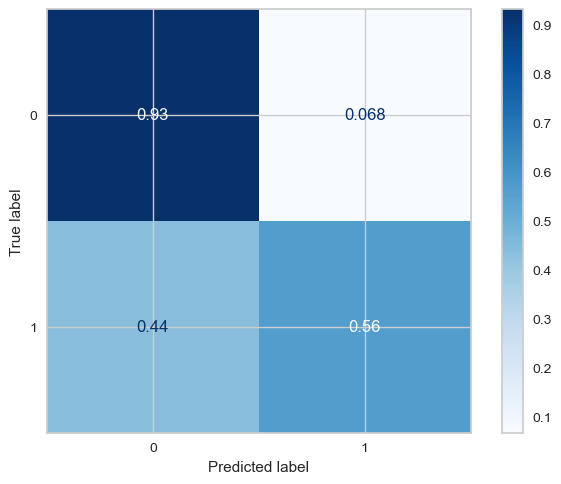

In [79]:
ConfusionMatrixDisplay.from_estimator(knn_pipeline, x_test, y_test,
                                      display_labels=class_names,
                                      normalize="true", cmap=plt.cm.Blues);

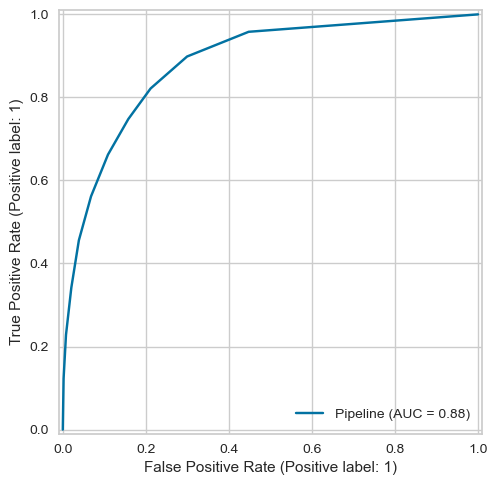

In [80]:
RocCurveDisplay.from_estimator(knn_pipeline, x_test, y_test);

---

#### Tuning hyperparameters

In [81]:
knn_param_grid = {
    "clf__n_neighbors": [5, 10, 15, 20, 30],
    "clf__weights": ["uniform", "distance"],
    "clf__p": [1, 2],
}
knn_grid_search = GridSearchCV(knn_pipeline, knn_param_grid, cv=cv, scoring="roc_auc", n_jobs=-1)

In [82]:
knn_grid_search.fit(x_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=91, shuffle=False),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                                        ('ord',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleI...
                                                                        ('country',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='United-States',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['native_country'])])),
                                       ('clf',
                                        KNeighborsClassifier(n_neighbors=10))]),
             n_jobs=-1,
             param_grid={'clf__n_neighbors': [5, 10, 15, 20, 30],
                         'clf__p': [1, 2],
                         'clf__weights': ['uniform', 'distance']},
             scoring='roc_auc')

In [83]:

knn_y_pred_test_opt = knn_grid_search.predict(x_test)
knn_y_proba_test_opt = knn_grid_search.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, knn_y_proba_test_opt):.2f}")
logger.info(f"F1-score: {f1_score(y_test, knn_y_pred_test_opt):.2f}")
logger.info(f"Accuracy: {accuracy_score(y_test, knn_y_pred_test_opt):.2f}")


2025-05-04 00:33:56.095 | INFO     | __main__:<module>:5 - AUC: 0.89
2025-05-04 00:33:56.110 | INFO     | __main__:<module>:6 - F1-score: 0.65
2025-05-04 00:33:56.117 | INFO     | __main__:<module>:7 - Accuracy: 0.85


In [84]:
print(classification_report(y_test,knn_y_pred_test_opt))

              precision    recall  f1-score   support

           0       0.88      0.93      0.90      7416
           1       0.72      0.59      0.65      2336

    accuracy                           0.85      9752
   macro avg       0.80      0.76      0.78      9752
weighted avg       0.84      0.85      0.84      9752



In [85]:
data_lift = pd.DataFrame({"y_true": y_test, "y_pred": knn_y_pred_test_opt, "proba": knn_y_proba_test_opt})
data_lift = data_lift.sort_values("proba", ascending=False).reset_index(drop=True)
data_lift.head()
# Decile
data_lift["decile"] = pd.qcut(data_lift.index, 10, labels=False)
data_lift.head()# features importances
# Global positive rate
global_positive_rate =  data_lift["y_true"].sum() / len(data_lift)
global_positive_rate
lift_aggregate_table = data_lift.groupby("decile")["y_true"].agg(["sum","count"])

In [86]:
lift_aggregate_table["cum_positives"] = lift_aggregate_table["sum"].cumsum()

lift_aggregate_table["positive_rate_cum"] = lift_aggregate_table["cum_positives"] / lift_aggregate_table["count"].cumsum()
lift_aggregate_table["lift_score"] = lift_aggregate_table["positive_rate_cum"] / global_positive_rate

lift_aggregate_table["percent_sample"] = 10 * (lift_aggregate_table.index + 1)

lift_aggregate_table

,sum,count,cum_positives,positive_rate_cum,lift_score,percent_sample
decile,,,,,,
0,809,976,809,0.828893,3.460346,10
1,591,975,1400,0.717581,2.995654,20
2,361,975,1761,0.601846,2.512499,30
3,278,975,2039,0.522686,2.182037,40
4,165,975,2204,0.452010,1.886986,50
5,71,975,2275,0.388822,1.623200,60
6,32,975,2307,0.337972,1.410919,70
7,14,975,2321,0.297526,1.242069,80
8,8,975,2329,0.265383,1.107883,90


In [87]:
px.line(
    lift_aggregate_table,
    x="percent_sample",
    y="lift_score",
    labels={
        "percent_sample": "Cumulative % of Sample",
        "lift_score": "Lift Score"
    },
    title="Lift Curve"
)

---

#### Discrimination threshold

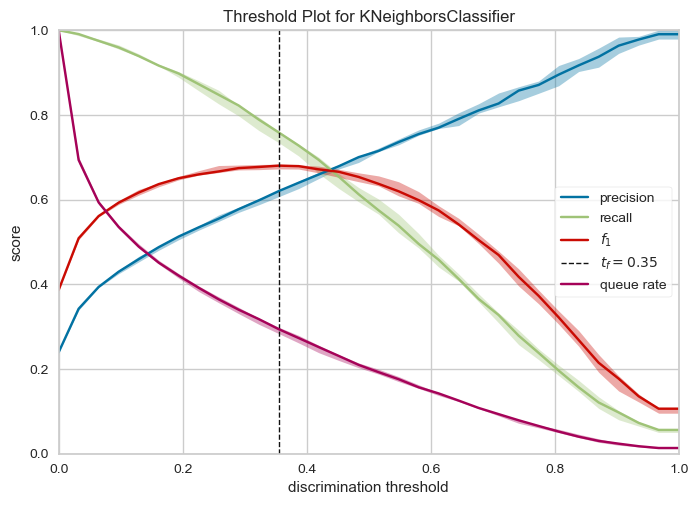

In [88]:
viz = DiscriminationThreshold(knn_grid_search.best_estimator_, random_state=42, fbeta=1.0, cv=cv, argmax="fscore")

# Fit et plot
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
viz.show();

In [89]:
best_threshold_knn=0.35
logger.info(f"Best threshold:{best_threshold_knn}")


2025-05-04 01:40:39.111 | INFO     | __main__:<module>:2 - Best threshold:0.35


In [90]:
# Evaluation avec seuil 0.61
knn_y_proba_test_opt = knn_grid_search.predict_proba(x_test)[:, 1]
knn_y_pred_test_opt = (knn_y_proba_test_opt >= best_threshold_knn).astype(int)

logger.info(f"AUC : {roc_auc_score(y_test, knn_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, knn_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, knn_y_pred_test_opt):.2f}")

2025-05-04 01:41:03.457 | INFO     | __main__:<module>:5 - AUC : 0.89
2025-05-04 01:41:03.468 | INFO     | __main__:<module>:6 - F1-score : 0.67
2025-05-04 01:41:03.474 | INFO     | __main__:<module>:7 - Accuracy : 0.82


---
---
---

## Todo
- Entraîner / optimiser 2 modèles ensemblistes
- Choisir le meilleur modèle parmi tous ceux qu'on a entraîné
- Étudier la feature importance global et local avec shap
- Optimiser si besoin le modèle et l'enregistrer au format .dill

- **Deadline** : mardi 6/5/2025 à 18h
- **Email** : mouslydiaw@gmail.com
- **Objet** : TP ISE - Classification 2025

---
---
---

### Installation de Shap

In [91]:
%pip install shap

Note: you may need to restart the kernel to use updated packages.


In [92]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
import shap
import dill
import matplotlib.pyplot as plt
import seaborn as sns


---
---
---

## Partie 1:  Entraîner / optimiser 2 modèles ensemblistes

### Random forest

---

#### Baseline

In [124]:
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])
rf_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

In [94]:
# Entraînement
rf_pipeline.fit(x_train, y_train)

# Prédictions & évaluation
rf_y_pred_test = rf_pipeline.predict(x_test)
rf_y_proba_test = rf_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, rf_y_proba_test):.2f}")

logger.info(f"Classification report: \n{classification_report(y_test, rf_y_pred_test)}")

2025-05-04 01:42:24.922 | INFO     | __main__:<module>:9 - AUC: 0.89
2025-05-04 01:42:24.952 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.89      0.91      0.90      7416
           1       0.70      0.63      0.66      2336

    accuracy                           0.85      9752
   macro avg       0.79      0.77      0.78      9752
weighted avg       0.84      0.85      0.84      9752



---

#### Tuning hyperparameters

In [95]:
rf_param_grid = {
    'classifier__n_estimators': [100, 200],
    'classifier__max_depth': [None, 10, 20]
}

rf_grid = GridSearchCV(rf_pipeline, rf_param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
rf_grid.fit(x_train, y_train)
print("Best Random Forest params:", rf_grid.best_params_)


Best Random Forest params: {'classifier__max_depth': 20, 'classifier__n_estimators': 200}


In [96]:

rf_y_pred_test_opt = rf_grid.predict(x_test)
rf_y_proba_test_opt = rf_grid.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, rf_y_proba_test_opt):.2f}")
logger.info(f"F1-score: {f1_score(y_test, rf_y_pred_test_opt):.2f}")
logger.info(f"Accuracy: {accuracy_score(y_test, rf_y_pred_test_opt):.2f}")

2025-05-04 01:53:31.679 | INFO     | __main__:<module>:5 - AUC: 0.91
2025-05-04 01:53:31.691 | INFO     | __main__:<module>:6 - F1-score: 0.69
2025-05-04 01:53:31.695 | INFO     | __main__:<module>:7 - Accuracy: 0.86


In [97]:
data_lift = pd.DataFrame({"y_true": y_test, "y_pred": rf_y_pred_test_opt, "proba": rf_y_proba_test_opt})
data_lift = data_lift.sort_values("proba", ascending=False).reset_index(drop=True)
data_lift.head()
# Decile
data_lift["decile"] = pd.qcut(data_lift.index, 10, labels=False)
data_lift.head()# features importances
# Global positive rate
global_positive_rate =  data_lift["y_true"].sum() / len(data_lift)
global_positive_rate
lift_aggregate_table = data_lift.groupby("decile")["y_true"].agg(["sum","count"])

In [98]:
lift_aggregate_table["cum_positives"] = lift_aggregate_table["sum"].cumsum()

lift_aggregate_table["positive_rate_cum"] = lift_aggregate_table["cum_positives"] / lift_aggregate_table["count"].cumsum()
lift_aggregate_table["lift_score"] = lift_aggregate_table["positive_rate_cum"] / global_positive_rate

lift_aggregate_table["percent_sample"] = 10 * (lift_aggregate_table.index + 1)

lift_aggregate_table

,sum,count,cum_positives,positive_rate_cum,lift_score,percent_sample
decile,,,,,,
0,893,976,893,0.914959,3.819641,10
1,588,975,1481,0.759098,3.168974,20
2,354,975,1835,0.627136,2.618078,30
3,240,975,2075,0.531915,2.220563,40
4,161,975,2236,0.458573,1.914384,50
5,63,975,2299,0.392924,1.640324,60
6,19,975,2318,0.339584,1.417647,70
7,12,975,2330,0.298680,1.246885,80
8,6,975,2336,0.266180,1.111212,90


In [99]:
px.line(
    lift_aggregate_table,
    x="percent_sample",
    y="lift_score",
    labels={
        "percent_sample": "Cumulative % of Sample",
        "lift_score": "Lift Score"
    },
    title="Lift Curve"
)

---

#### Discrimination threshold

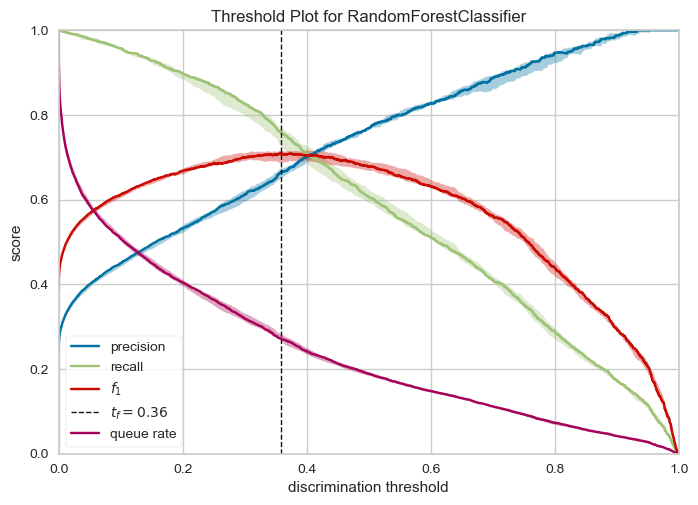

In [100]:
viz = DiscriminationThreshold(rf_grid.best_estimator_, random_state=42, fbeta=1.0, cv=cv, argmax="fscore")

# Fit et plot
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
viz.show();

In [101]:
print(classification_report(y_test,rf_y_pred_test_opt))

              precision    recall  f1-score   support

           0       0.89      0.94      0.91      7416
           1       0.76      0.63      0.69      2336

    accuracy                           0.86      9752
   macro avg       0.83      0.78      0.80      9752
weighted avg       0.86      0.86      0.86      9752



In [103]:
best_threshold_rf=0.36
logger.info(f"Best threshold:{best_threshold_rf}")


2025-05-04 06:46:14.090 | INFO     | __main__:<module>:2 - Best threshold:0.36


In [104]:
# Evaluation avec seuil 
rf_y_proba_test_opt = rf_grid.predict_proba(x_test)[:, 1]
rf_y_pred_test_opt = (rf_y_proba_test_opt >= best_threshold_rf).astype(int)

logger.info(f"AUC : {roc_auc_score(y_test, rf_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, rf_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, rf_y_pred_test_opt):.2f}")

2025-05-04 06:46:18.785 | INFO     | __main__:<module>:5 - AUC : 0.91
2025-05-04 06:46:18.796 | INFO     | __main__:<module>:6 - F1-score : 0.70
2025-05-04 06:46:18.801 | INFO     | __main__:<module>:7 - Accuracy : 0.84


---
---
---

### Gradient Boosting

---

#### Baseline

In [125]:
gb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', GradientBoostingClassifier(random_state=42))
])
gb_pipeline



Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('classifier', GradientBoostingClassifier(random_state=42))])

In [106]:
# 8. Entraînement
gb_pipeline.fit(x_train, y_train)

# 9. Prédictions & évaluation
rf_y_pred_test = gb_pipeline.predict(x_test)
rf_y_proba_test = gb_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, rf_y_proba_test):.2f}")

logger.info(f"Classification report: \n{classification_report(y_test, rf_y_pred_test)}")

2025-05-04 06:46:43.363 | INFO     | __main__:<module>:9 - AUC: 0.92
2025-05-04 06:46:43.427 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.89      0.94      0.92      7416
           1       0.78      0.63      0.70      2336

    accuracy                           0.87      9752
   macro avg       0.83      0.79      0.81      9752
weighted avg       0.86      0.87      0.86      9752



---

#### Tuning hyperparameters

In [107]:
gb_param_grid = {
    'classifier__n_estimators': [100, 200],
    'classifier__learning_rate': [0.05, 0.1],
    'classifier__max_depth': [3, 5]
}

gb_grid = GridSearchCV(gb_pipeline, gb_param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
gb_grid.fit(x_train, y_train)
print("Best Gradient Boosting params:", gb_grid.best_params_)


Best Gradient Boosting params: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 5, 'classifier__n_estimators': 200}


In [108]:

gb_y_pred_test_opt = gb_grid.predict(x_test)
gb_y_proba_test_opt = gb_grid.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, gb_y_proba_test_opt):.2f}")
logger.info(f"F1-score: {f1_score(y_test, gb_y_pred_test_opt):.2f}")
logger.info(f"Accuracy: {accuracy_score(y_test, gb_y_pred_test_opt):.2f}")

2025-05-04 06:51:41.728 | INFO     | __main__:<module>:5 - AUC: 0.93
2025-05-04 06:51:41.739 | INFO     | __main__:<module>:6 - F1-score: 0.72
2025-05-04 06:51:41.744 | INFO     | __main__:<module>:7 - Accuracy: 0.87


In [109]:
print(classification_report(y_test,gb_y_pred_test_opt))

              precision    recall  f1-score   support

           0       0.90      0.94      0.92      7416
           1       0.77      0.68      0.72      2336

    accuracy                           0.87      9752
   macro avg       0.84      0.81      0.82      9752
weighted avg       0.87      0.87      0.87      9752



In [110]:
data_lift = pd.DataFrame({"y_true": y_test, "y_pred": gb_y_pred_test_opt, "proba": gb_y_proba_test_opt})
data_lift = data_lift.sort_values("proba", ascending=False).reset_index(drop=True)
data_lift.head()
# Decile
data_lift["decile"] = pd.qcut(data_lift.index, 10, labels=False)
data_lift.head()# features importances
# Global positive rate
global_positive_rate =  data_lift["y_true"].sum() / len(data_lift)
global_positive_rate
lift_aggregate_table = data_lift.groupby("decile")["y_true"].agg(["sum","count"])

In [111]:
lift_aggregate_table["cum_positives"] = lift_aggregate_table["sum"].cumsum()

lift_aggregate_table["positive_rate_cum"] = lift_aggregate_table["cum_positives"] / lift_aggregate_table["count"].cumsum()
lift_aggregate_table["lift_score"] = lift_aggregate_table["positive_rate_cum"] / global_positive_rate

lift_aggregate_table["percent_sample"] = 10 * (lift_aggregate_table.index + 1)

lift_aggregate_table

,sum,count,cum_positives,positive_rate_cum,lift_score,percent_sample
decile,,,,,,
0,921,976,921,0.943648,3.939405,10
1,611,975,1532,0.785238,3.278101,20
2,375,975,1907,0.651743,2.720804,30
3,227,975,2134,0.547039,2.283701,40
4,129,975,2263,0.464110,1.937500,50
5,44,975,2307,0.394292,1.646032,60
6,18,975,2325,0.340609,1.421928,70
7,7,975,2332,0.298936,1.247956,80
8,3,975,2335,0.266067,1.110737,90


In [112]:
px.line(
    lift_aggregate_table,
    x="percent_sample",
    y="lift_score",
    labels={
        "percent_sample": "Cumulative % of Sample",
        "lift_score": "Lift Score"
    },
    title="Lift Curve"
)

---

#### Discrimination threshold

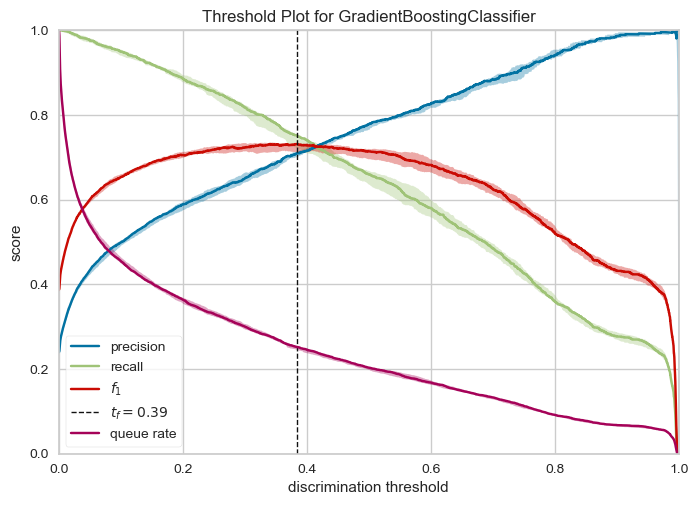

In [ ]:
viz = DiscriminationThreshold(gb_grid.best_estimator_, random_state=42, fbeta=1.0, cv=cv, argmax="fscore")
# Fit et plot
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
viz.show();

In [117]:
best_threshold_gb=0.39
logger.info(f"Best threshold:{best_threshold_gb}")

2025-05-04 08:32:46.633 | INFO     | __main__:<module>:2 - Best threshold:0.39


In [118]:
# Evaluation avec seuil 
gb_y_proba_test_opt = gb_grid.predict_proba(x_test)[:, 1]
gb_y_pred_test_opt = (gb_y_proba_test_opt >= best_threshold_gb).astype(int)

logger.info(f"AUC : {roc_auc_score(y_test, gb_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, gb_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, gb_y_pred_test_opt):.2f}")

2025-05-04 08:32:49.263 | INFO     | __main__:<module>:5 - AUC : 0.93
2025-05-04 08:32:49.273 | INFO     | __main__:<module>:6 - F1-score : 0.73
2025-05-04 08:32:49.278 | INFO     | __main__:<module>:7 - Accuracy : 0.86


---
---
---

## Partie 2: Choisir le meilleur modèle parmi tous ceux qu'on a entraîné

### Comparaison des modèles

In [121]:
models = {
    "Régression Logistique": (rl_grid_search.best_estimator_, best_threshold_rl),
    "KNN": (knn_grid_search.best_estimator_, best_threshold_knn),
    "Random Forest": (rf_grid.best_estimator_, best_threshold_rf),
    "Gradient Boosting": (gb_grid.best_estimator_, best_threshold_gb)
}

for name, (model, threshold) in models.items():
    y_pred_proba = model.predict_proba(x_test)[:, 1]
    y_pred = (y_pred_proba >= threshold).astype(int)

    print(f"\n📌 {name}")
    print("AUC:", roc_auc_score(y_test, y_pred_proba))
    print("F1-score:", f1_score(y_test, y_pred))
    print("Classification Report:\n", classification_report(y_test, y_pred))



📌 Régression Logistique
AUC: 0.8981887089743021
F1-score: 0.6789883268482491
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.86      0.89      7416
           1       0.62      0.75      0.68      2336

    accuracy                           0.83      9752
   macro avg       0.77      0.80      0.78      9752
weighted avg       0.84      0.83      0.84      9752


📌 KNN
AUC: 0.8942621112164
F1-score: 0.6684563758389261
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.85      0.88      7416
           1       0.61      0.75      0.67      2336

    accuracy                           0.82      9752
   macro avg       0.76      0.80      0.77      9752
weighted avg       0.84      0.82      0.83      9752


📌 Random Forest
AUC: 0.9145638629822967
F1-score: 0.697766356987547
Classification Report:
               precision    recall  f1-score   support

           0   

---
---
---

---
---
---

### Le modèle final: Gradient Boosting

In [162]:
y_pred_proba = gb_grid.best_estimator_.predict_proba(x_test)[:, 1]
y_pred = (y_pred_proba >= best_threshold_gb).astype(int)

print(f"\n📌 {name}")
print("AUC:", roc_auc_score(y_test, y_pred_proba))
print("F1-score:", f1_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))



📌 Gradient Boosting
AUC: 0.9297464074806785
F1-score: 0.7268585628494513
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.90      0.91      7416
           1       0.70      0.75      0.73      2336

    accuracy                           0.86      9752
   macro avg       0.81      0.83      0.82      9752
weighted avg       0.87      0.86      0.87      9752



---
---
---

## Partie 3: Feature importance avec Shap

---
---
---

### Feature Importance avec Shap

---
---
---

In [155]:
data.columns

Index(['age', 'workclass', 'education', 'marital_status', 'occupation',
       'relationship', 'race', 'sex', 'hours_per_week', 'native_country',
       'income', 'capital_diff'],
      dtype='object')

### Vue globale

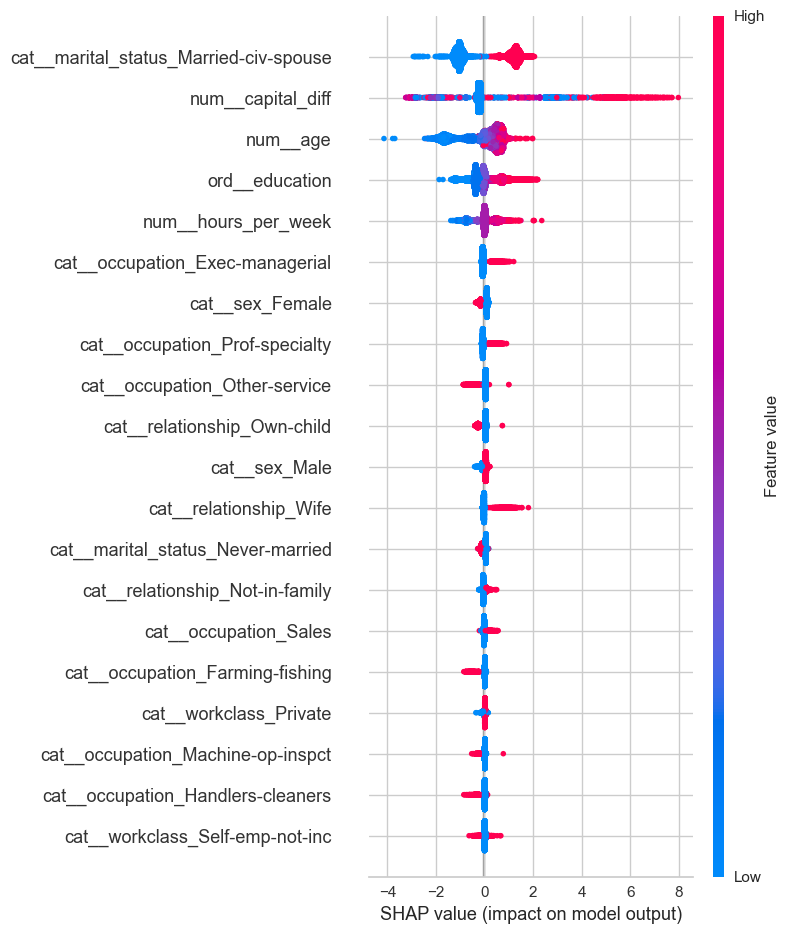

In [ ]:
# 📌 Extraction du meilleur modèle gradient boosting
best_model = gb_grid.best_estimator_.named_steps['classifier']

# 📌 Transformation des données
# Étape 2 : Appliquer le préprocesseur SEULEMENT sur les données de test
X_processed = gb_grid.best_estimator_.named_steps["preprocessor"].transform(x_test)
# 📌 Conversion en dense si nécessaire
if hasattr(X_processed, "toarray"):
    X_processed = X_processed.toarray()


# 📌 Création du DataFrame avec les noms des colonnes
feature_names = preprocessor.get_feature_names_out()
X_df = pd.DataFrame(X_processed, columns=feature_names)

# Étape 5 : Créer un explainer SHAP dédié aux arbres
explainer = shap.TreeExplainer(best_model)

# Étape 6 : Calculer les valeurs SHAP avec additivity désactivée
shap_values = explainer.shap_values(X_df, check_additivity=False)
# Résumé global
shap.summary_plot(shap_values, X_df)


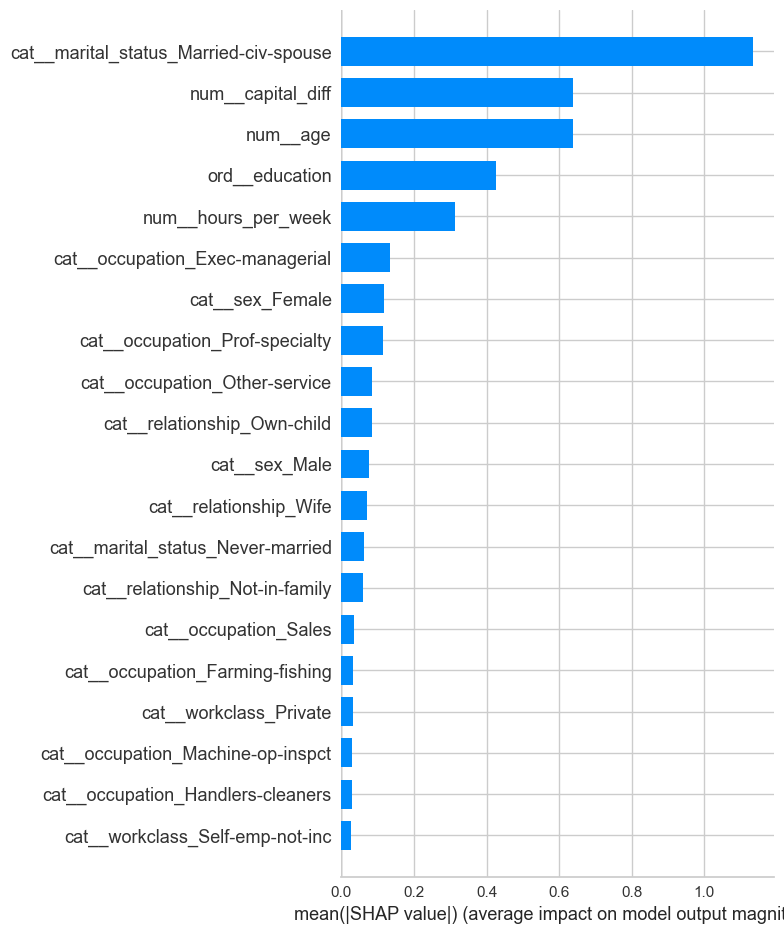

In [151]:
shap.summary_plot(shap_values, X_df, plot_type="bar")

In [167]:
top_features = X_df.columns[np.argsort(np.abs(shap_values).mean(0))[-5:]]
print(top_features)


Index(['num__hours_per_week', 'ord__education', 'num__age',
       'num__capital_diff', 'cat__marital_status_Married-civ-spouse'],
      dtype='object')


---

### Vue locale

#### Waterfall pour 5 individus

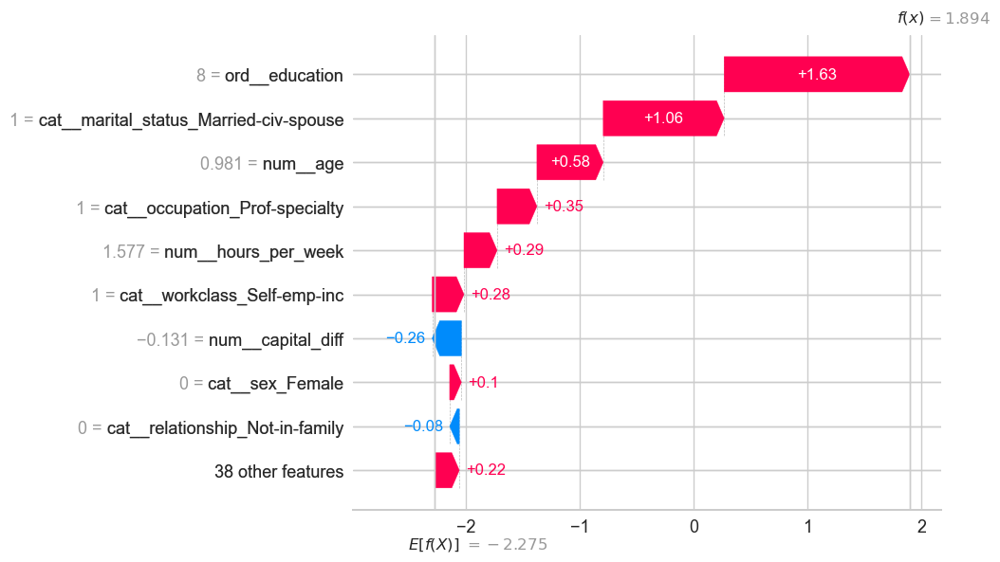

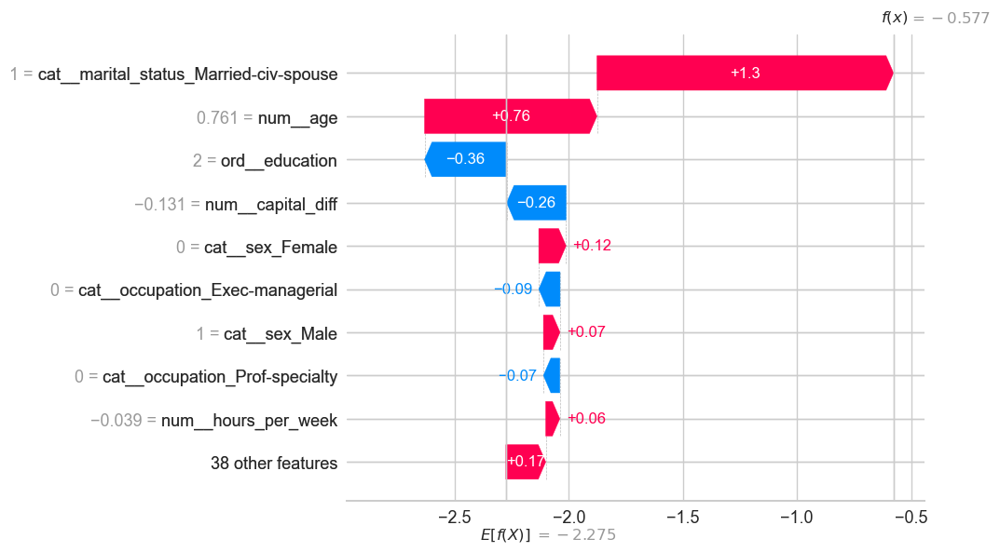

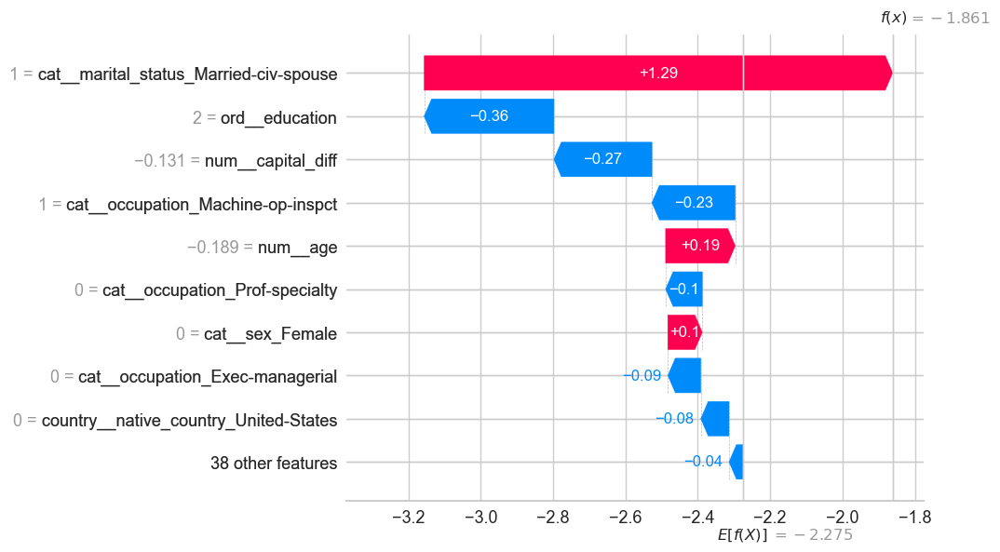

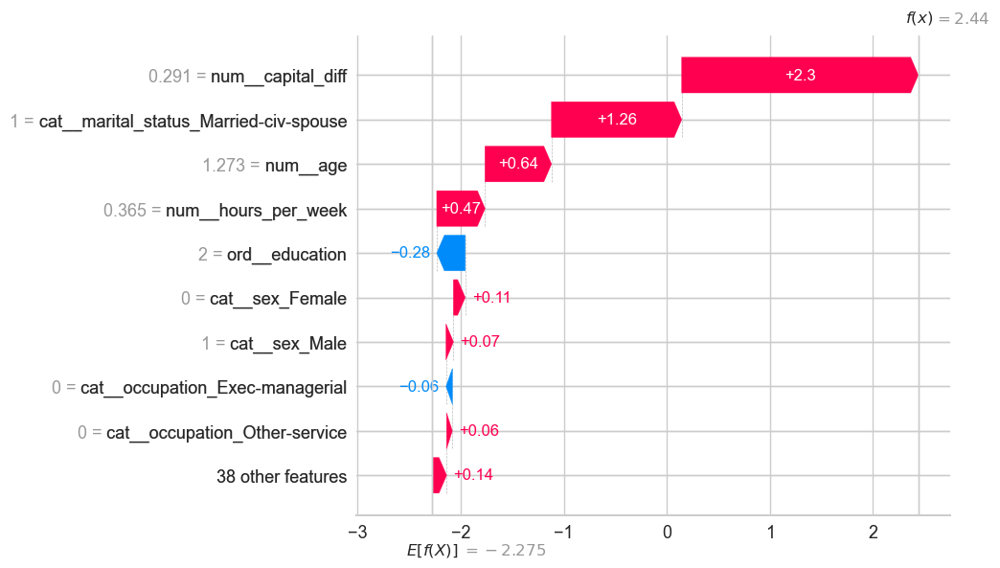

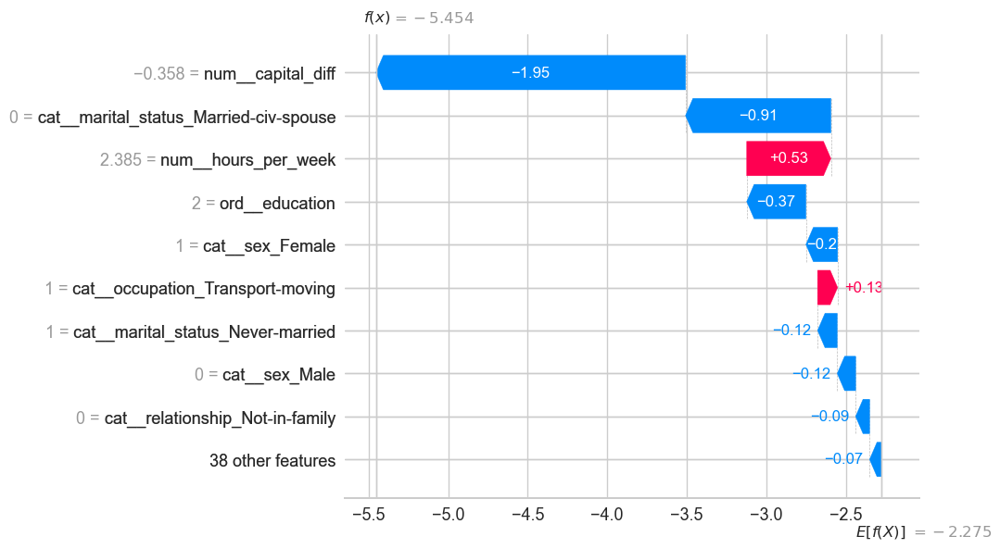

In [160]:
for i in range(5):
    shap.plots.waterfall(shap.Explanation(values=shap_values[i],
                                          base_values=explainer.expected_value,
                                          data=X_df.iloc[i],
                                          feature_names=feature_names))


---

---
---
---

## Partie 4 : Enregistrement du modèle final: gradient boosting

---
---
---

---

In [ ]:

# Save model
model_path_name = Path(MODEL_DIR, "modele_final.dill")
logger.info(f"Model path name: {model_path_name}")
with open(model_path_name, "wb") as fp:
    dill.dump(gb_grid.best_estimator_, fp)


2025-05-04 21:27:36.584 | INFO     | __main__:<module>:4 - Model path name: d:\Users\hp\Documents\bibliothèque de travail\ELEVE INGENIEUR\ISE\Cours\ISE2\Semestre 2\MACHINE LEARNING II\Cours\tp-supervised-learning-master\models\modele_final.dill
